In [1]:
import os 
import pathlib
import sys
import pickle
from PIL import Image
import numpy as np

In [2]:
cwd = pathlib.Path().resolve()
sys.path.append(str(cwd.parent))

import embodied

In [3]:
agent_dir = cwd.parent / 'logdir/20230617-153620/'

In [4]:
eval_episodes_dir = agent_dir / 'final_eval'

# List files in eval_episodes_dir
eval_episodes_files = os.listdir(eval_episodes_dir)
print(len(eval_episodes_files))

100


In [5]:
import numpy as np 

filename = embodied.Path(eval_episodes_dir / eval_episodes_files[-1])
with filename.open('rb') as f:
  data = np.load(f)
  data = {k: data[k] for k in data.keys()}

In [6]:
list(data.keys())

['image',
 'reward',
 'is_first',
 'is_last',
 'is_terminal',
 'full_render',
 'action',
 'log_goal',
 'log_enc',
 'log_skill',
 'reset']

In [7]:
for key, value in data.items():
  print(f"{key} - Length: {value.shape[0]}")

image - Length: 145
reward - Length: 145
is_first - Length: 145
is_last - Length: 145
is_terminal - Length: 145
full_render - Length: 145
action - Length: 145
log_goal - Length: 145
log_enc - Length: 145
log_skill - Length: 145
reset - Length: 145


In [8]:
data['is_terminal']

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,

In [35]:
# Plot video data['image']
import matplotlib.animation
import matplotlib.pyplot as plt
import numpy as np
plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['figure.dpi'] = 150  
plt.ioff()
fig, ax = plt.subplots()

def animate(t):
    plt.cla()
    ax.imshow(data['log_enc'][t])

matplotlib.animation.FuncAnimation(fig, animate, frames=86) 

In [25]:
# Plot video data['image']
import matplotlib.animation
import matplotlib.pyplot as plt
import numpy as np
plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['figure.dpi'] = 150  
plt.ioff()
fig, ax = plt.subplots()

key = 'log_goal'
n_frames = data[key].shape[0]

def animate(t):
    plt.cla()
    ax.imshow(data[key][t])


matplotlib.animation.FuncAnimation(fig, animate, frames=n_frames) 

In [32]:
import networkx as nx
import numpy as np
from scipy.spatial.distance import cosine

def read_episodes(episodes_dir):
  eval_episodes_files = os.listdir(eval_episodes_dir)
  episodes = []
  for ep in eval_episodes_files:
    filename = embodied.Path(eval_episodes_dir / ep)
    with filename.open('rb') as f:
      data = np.load(f)
      data = {k: data[k] for k in data.keys()}
      episodes.append(data)

  return episodes

def filter_pivotal_states(episodes, lambda_threshold=0.5):
  
  # Filter pivotal states
  pivotal_states = []
  for i, episode in enumerate(episodes):
    pivotal_states.append([])
    ep_length = episode['image'].shape[0]
    for t in range(ep_length):
      full_render = episode['full_render'][t]
      image = episode['image'][t]
      encoded_state = episode['log_enc'][t]
      skill = episode['log_skill'][t]
      terminal = 'is_terminal'
      # Compute cosine similarity between s_t and g_t
      cosine_similarity = 1. - cosine(encoded_state.reshape(-1), skill.reshape(-1))

      # If cosine similarity < lambda or r_t is terminal, mark s_t as a pivotal state
      if cosine_similarity > lambda_threshold or terminal:
        pivotal_states[i].append((image, encoded_state, skill, terminal))
  return pivotal_states

In [33]:
1 - cosine([1,0,0], [0,1,0])

0.0

In [21]:
episodes_log = read_episodes(eval_episodes_dir)

In [43]:
transitions = filter_pivotal_states([episodes_log[0]], lambda_threshold=0.9)

/home/jwkim/anaconda3/envs/test/lib/python3.10/site-packages/scipy/spatial/distance.py:622: RuntimeWarning: invalid value encountered in float_scalars
  dist = 1.0 - uv / np.sqrt(uu * vv)


In [44]:
len(transitions[0])

145

In [45]:
def generate_worldgraph(episodes):
    world_graph = nx.DiGraph()

    # Add nodes
    for i, episode in enumerate(episodes):
        for j, state in enumerate(episode):
            # Add each state as a node
            # We use (i, j) as the node ID to ensure it's unique for each state
            world_graph.add_node((i, j), image=state[0], encoded_state=state[1], skill=state[2], terminal=state[3])

    # Add edges
    for i, episode in enumerate(episodes):
        for j in range(len(episode) - 1):
            # Add an edge from each state to the next state in the same episode
            world_graph.add_edge((i, j), (i, j + 1))

    return world_graph

In [50]:
world_graph = generate_worldgraph(transitions)

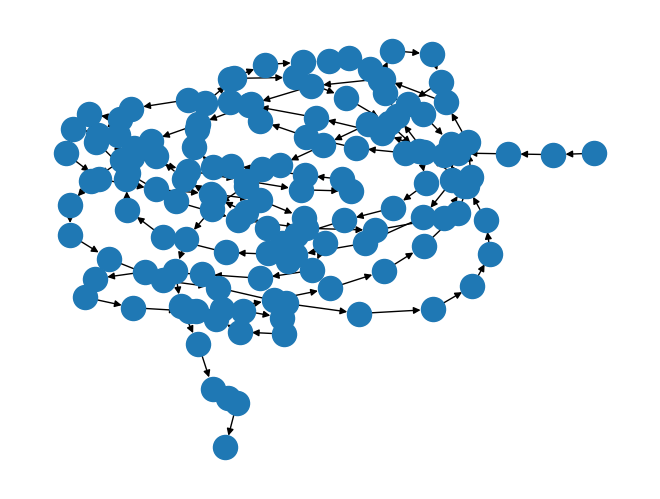

In [51]:
nx.draw(world_graph)

In [53]:
from bokeh.io import output_notebook, show
from bokeh.models import HoverTool, MultiLine, Circle, ColumnDataSource
from bokeh.plotting import figure, from_networkx
from bokeh.palettes import Spectral4
from bokeh.transform import linear_cmap
from networkx.drawing.layout import spring_layout

# Create a mapping from tuple identifiers to integers
id_mapping = {node: i for i, node in enumerate(world_graph.nodes)}

# Create a new graph with integer identifiers
integer_graph = nx.relabel_nodes(world_graph, id_mapping)

# Create a layout for the graph
layout = spring_layout(integer_graph)

# Convert numpy arrays to lists
layout = {node: list(pos) for node, pos in layout.items()}

# Create a Bokeh graph from the NetworkX input using the layout
graph = from_networkx(integer_graph, layout)

# Create a new plot
plot = figure(title="World Graph", x_range=(-1.1,1.1), y_range=(-1.1,1.1),
              tools="", toolbar_location=None)

# Add the Bokeh graph to the plot
plot.renderers.append(graph)

# Add hover tool
node_hover_tool = HoverTool(tooltips=[("index", "@index")])
plot.add_tools(node_hover_tool)

# Show the plot
output_notebook()
show(plot)


Loading BokehJS ...

In [56]:
from io import BytesIO
from bokeh.models import HoverTool
from bokeh.io import output_file, show
from bokeh.plotting import figure
from bokeh.models import ColumnDataSource
from bokeh.transform import factor_cmap
import base64
import PIL

# Convert images to base64
def pil_image_to_base64(image):
    buffered = BytesIO()
    image.save(buffered, format="PNG")
    img_str = base64.b64encode(buffered.getvalue())
    return img_str.decode('utf-8')

# Create a data source with the images
data = {
    'index': list(integer_graph.nodes),
    'image': [pil_image_to_base64(PIL.Image.fromarray(np.uint8(integer_graph.nodes[node]['image'] * 255))) for node in integer_graph.nodes]
}

source = ColumnDataSource(data)

# Create a new plot
plot = figure(x_range=(-1.1,1.1), y_range=(-1.1,1.1))

# Add the nodes to the plot
plot.circle('index', 'index', size=10, source=source)

# Add hover tool
hover = HoverTool()
hover.tooltips = """
    <div>
        <div>
            <img src="data:image/png;base64,@image" alt="" width="30" height="30" border="2"></img>
        </div>
    </div>
"""
plot.add_tools(hover)

# Show the plot
output_file("graph.html")
show(plot)
